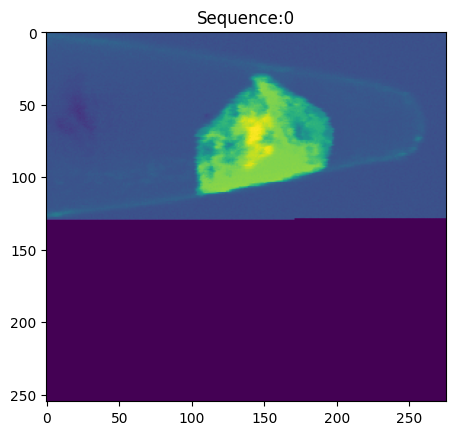

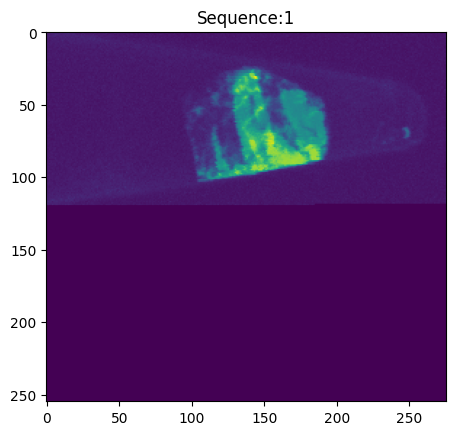

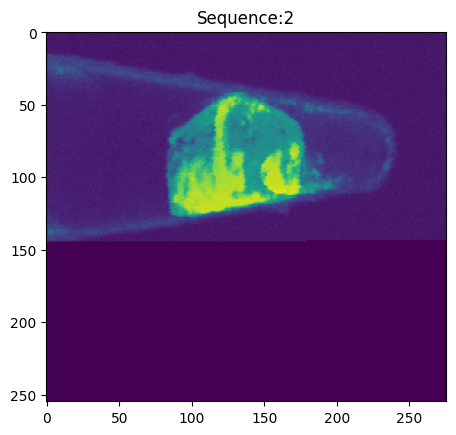

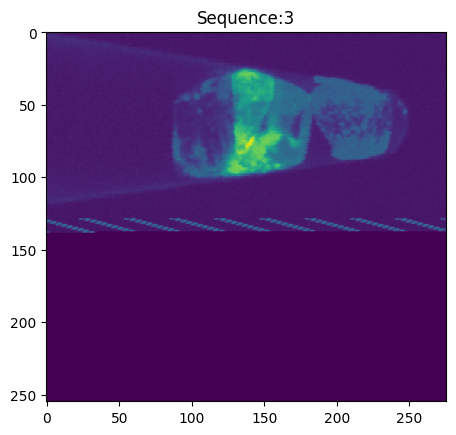

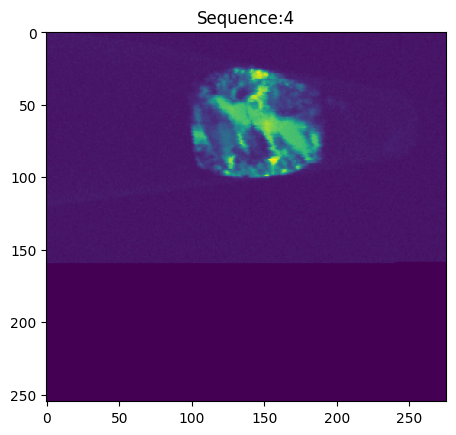

...

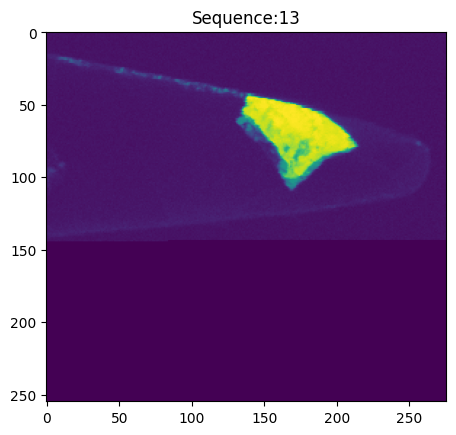

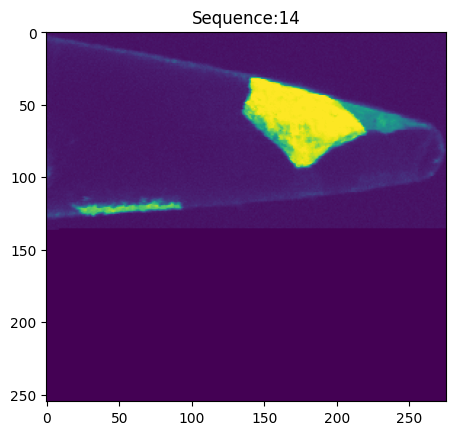

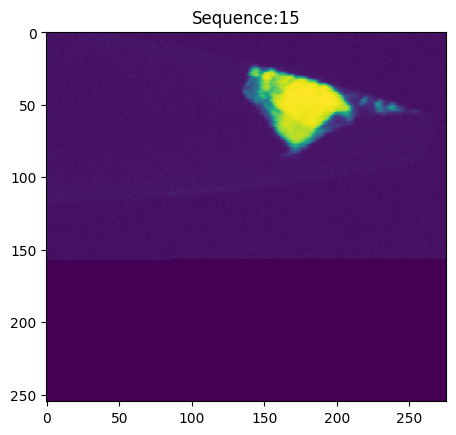

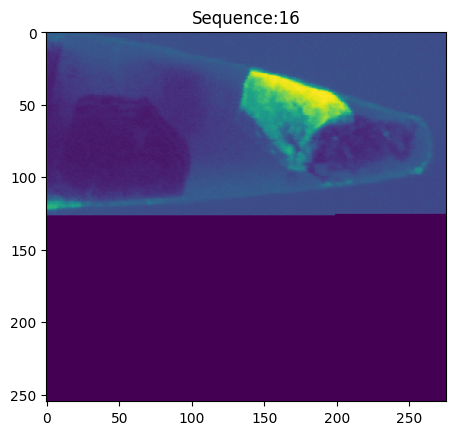

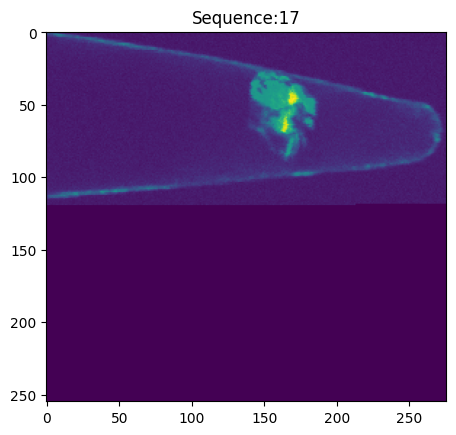

In [1]:
# import PySide2
from PySide2.QtCore import QCoreApplication, QFile, QPointF, Qt
from PySide2.QtGui import QIcon
from PySide2.QtUiTools import QUiLoader
from PySide2.QtWidgets import (
    QApplication,
    QFileDialog,
    QMainWindow,
    QMessageBox,
    QTableWidgetItem,
)
import math
import tkinter as tk
from tkinter import ttk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from ncempy.io import mrc
from ncempy.io.mrc import mrcReader
import matplotlib.pyplot as plt 
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np

f1name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(f1name) 
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

In [ ]:
# Set background as 0

mrc1['data'][mrc1['data'] < 1.5e-5] = 0

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

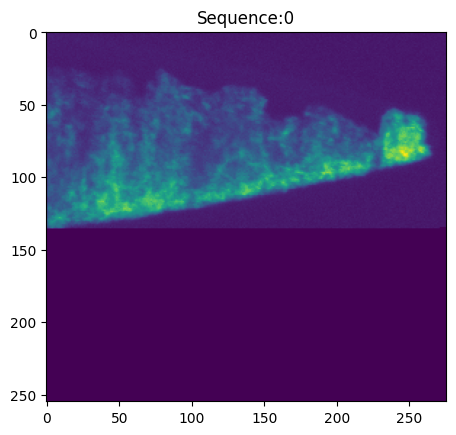

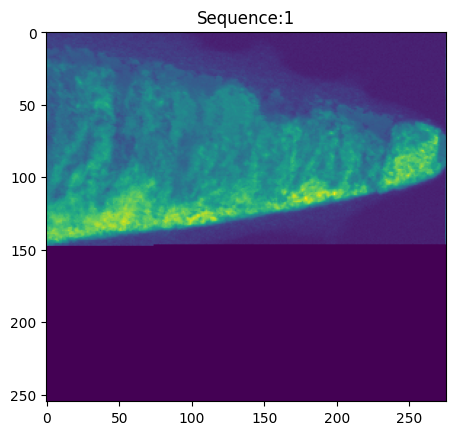

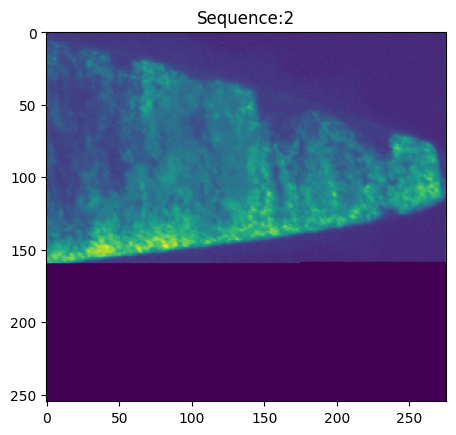

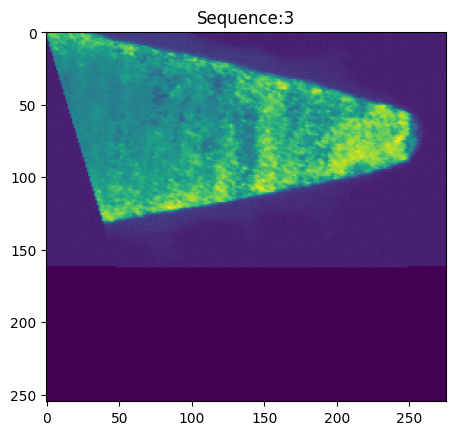

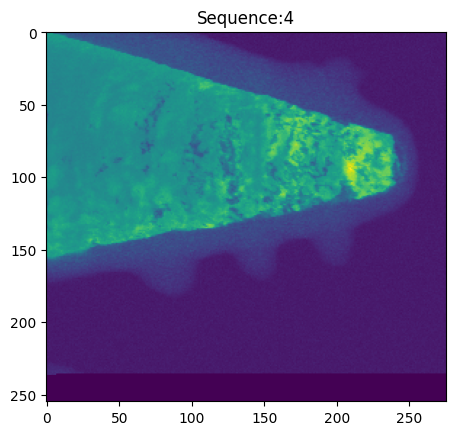

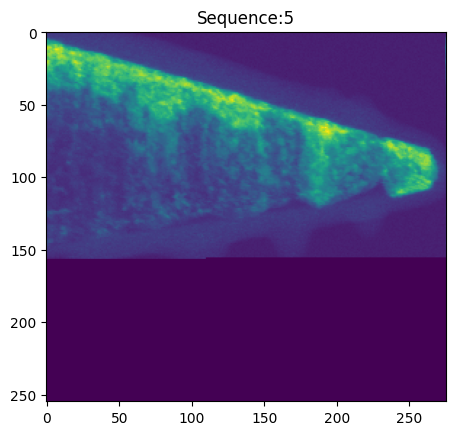

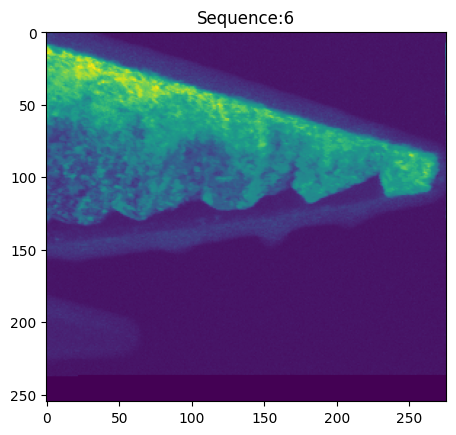

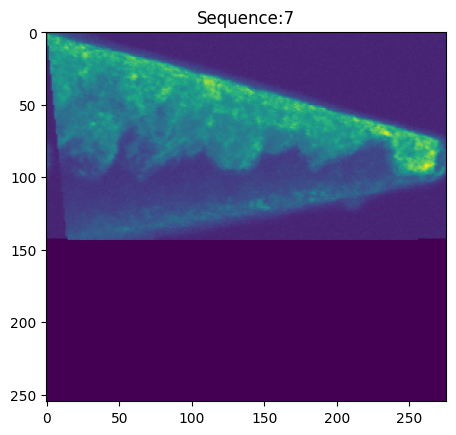

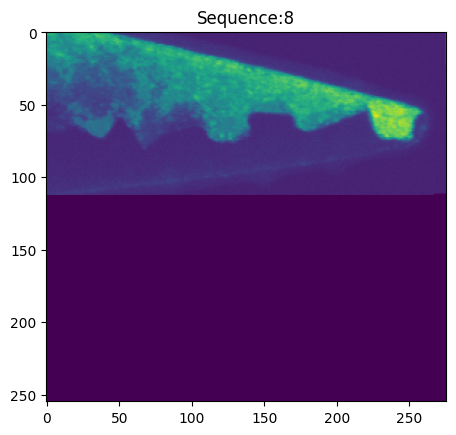

In [275]:
# left Drift compensation
row_index = 0  #  row_index is the start row number
rowdrifty=1  #initial value
seq=7 #image sequence
drift_factor=0.1; # left drift value of next row

for row in mrc1['data'][seq]:
    shifted_row = np.append(mrc1['data'][seq][row_index][-math.floor(rowdrifty):mrc1['data'][seq].shape[1]],mrc1['data'][seq][row_index][:-math.floor(rowdrifty)]) # append with [0,...]
    mrc1['data'][seq][row_index] = shifted_row 
    row_index=row_index+1
    rowdrifty=rowdrifty+drift_factor

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

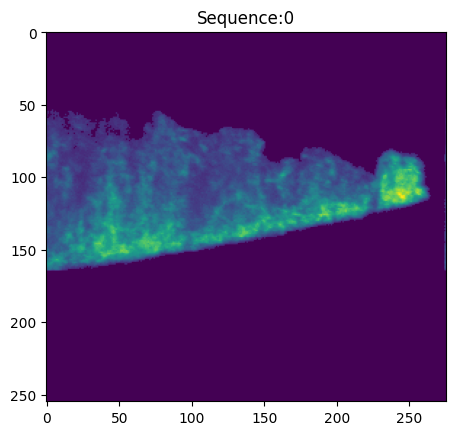

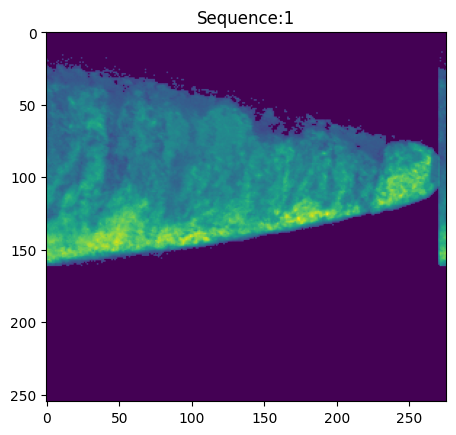

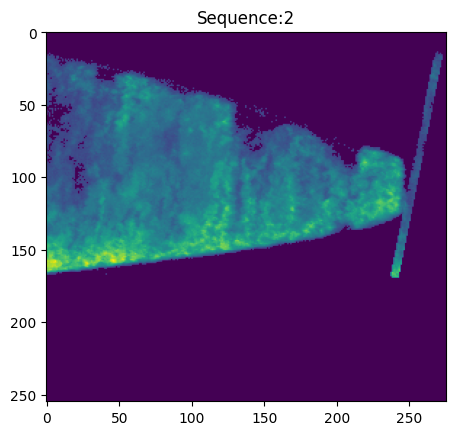

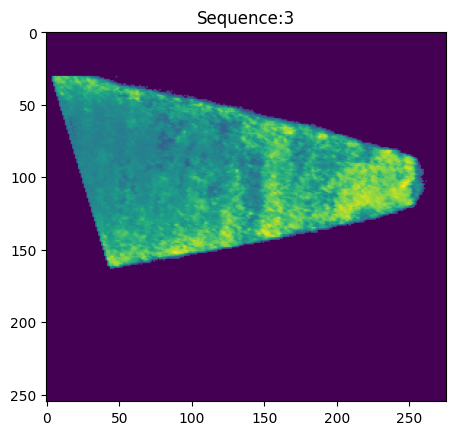

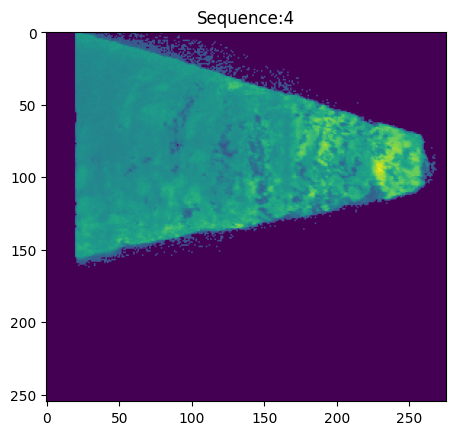

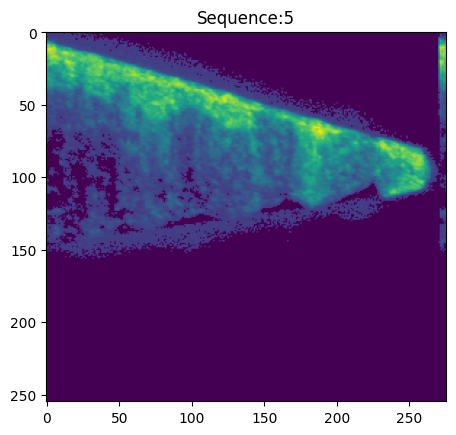

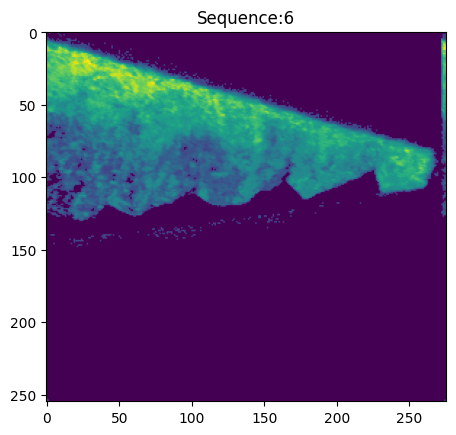

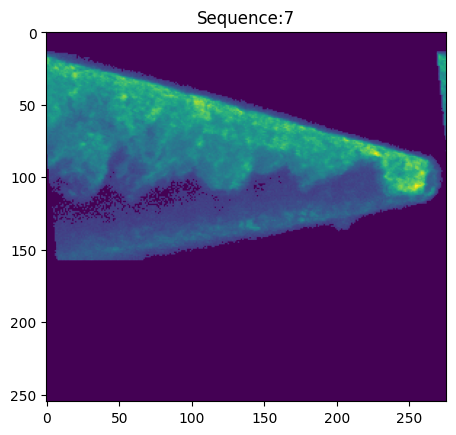

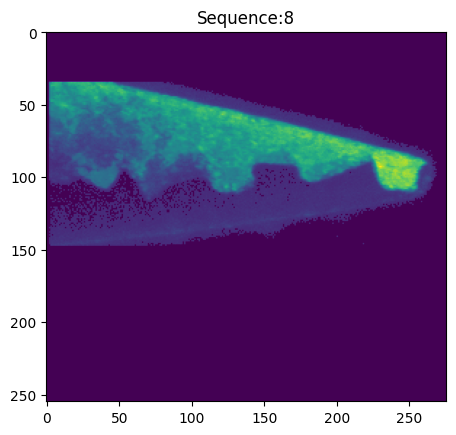

In [298]:
# right Drift compensation
row_index = 0  #  row_index is the start row number
rowdrifty=0  #initial value
seq=2 #image sequence
drift_factor=0.2; # left drift value of next row
for row in mrc1['data'][seq]:
    shifted_row = np.append(mrc1['data'][seq][row_index][math.floor(rowdrifty):],[0] * math.floor(rowdrifty)) # append with [0,...]
    mrc1['data'][seq][row_index] = shifted_row 
    row_index=row_index+1
    rowdrifty=rowdrifty+drift_factor


i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

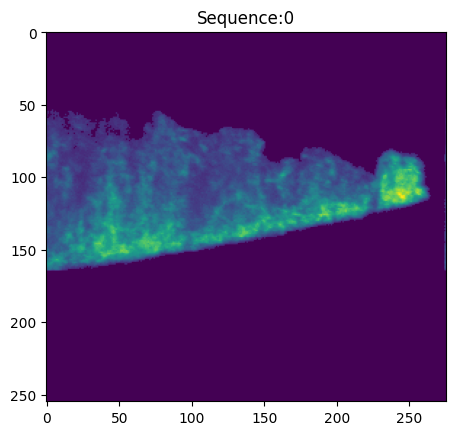

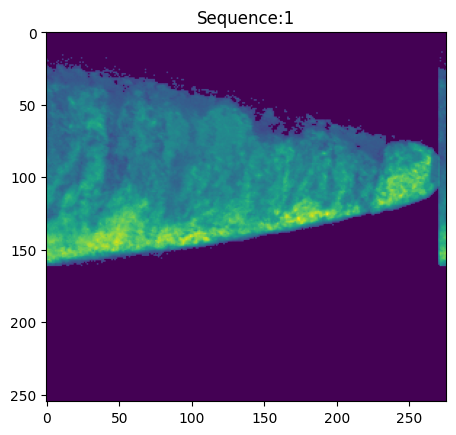

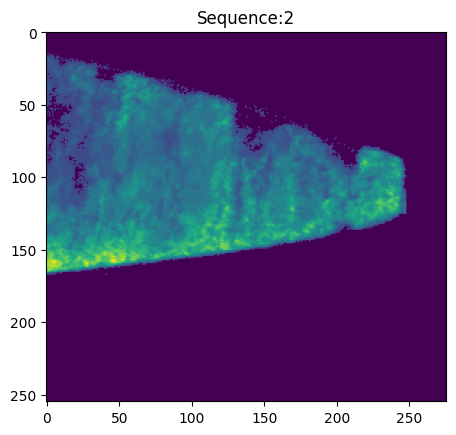

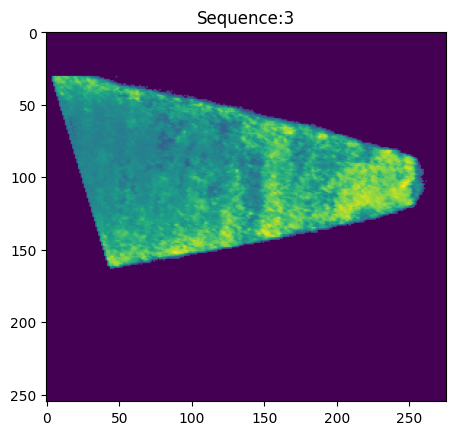

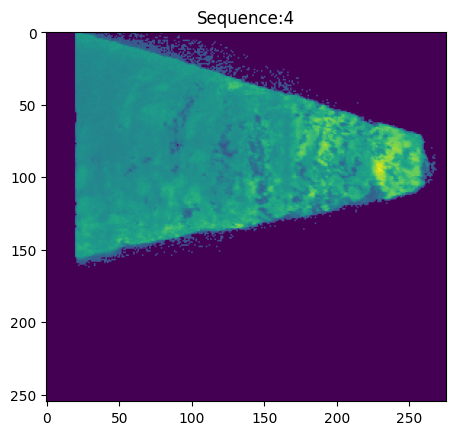

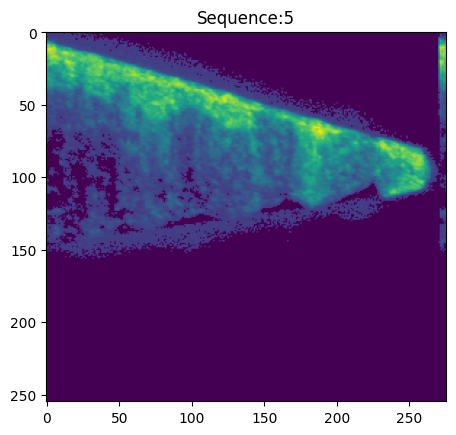

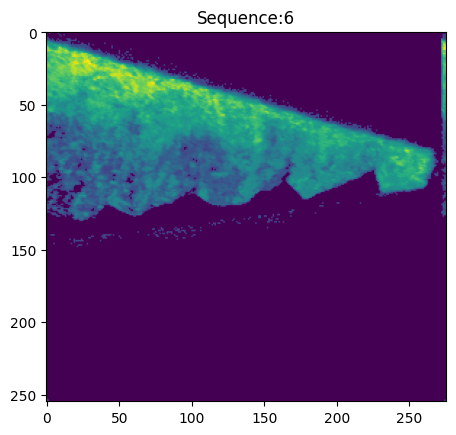

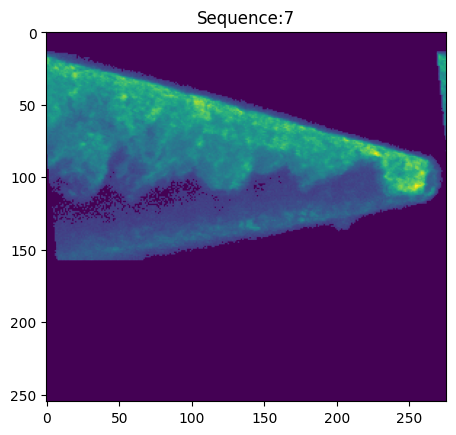

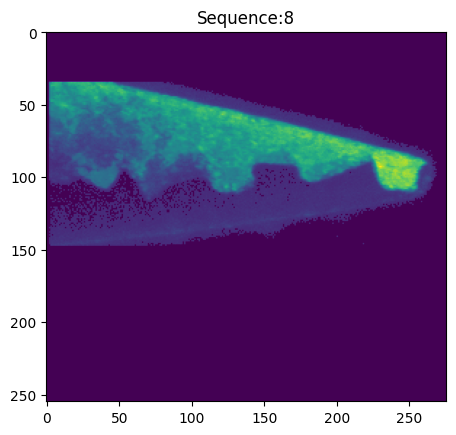

In [307]:
#Erase some parts
mrc1['data'][2][:,248:275]=0  #trim_y_mrc
mrc1['data'][2][126:200,243:275]=0  #trim_y_mrc
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

In [265]:
# Comparing two .mrc files with same shape
f1name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(f1name) 
f2name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc2 = mrc.mrcReader(f2name) 

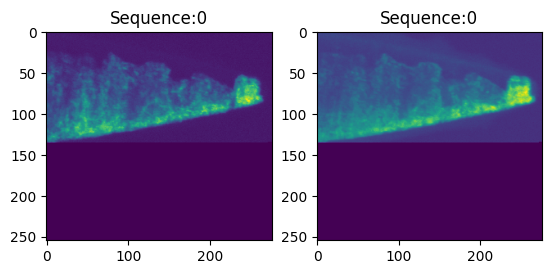

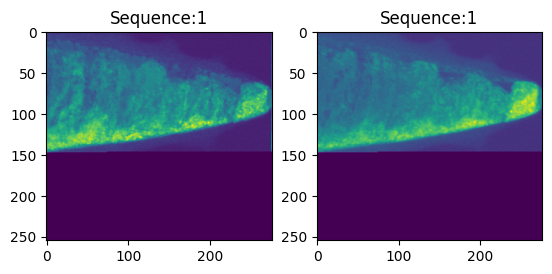

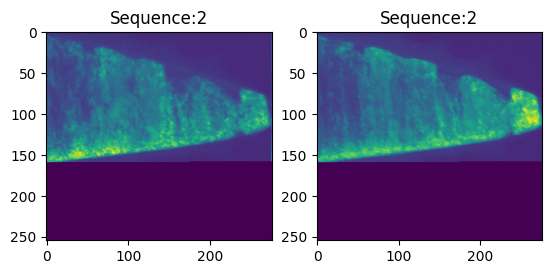

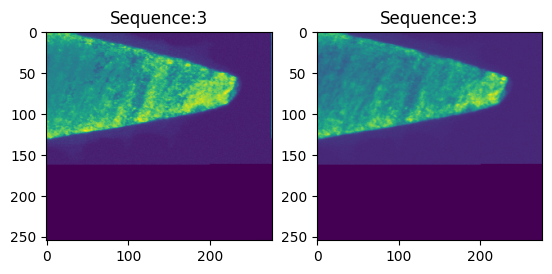

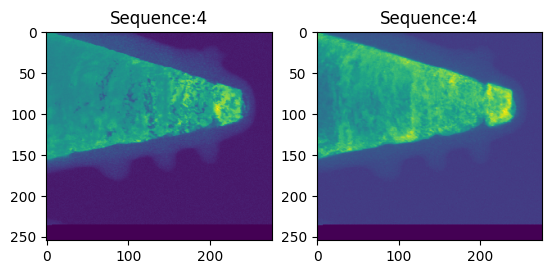

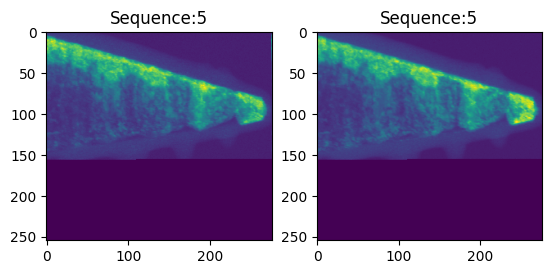

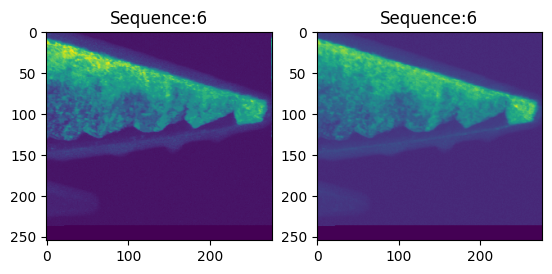

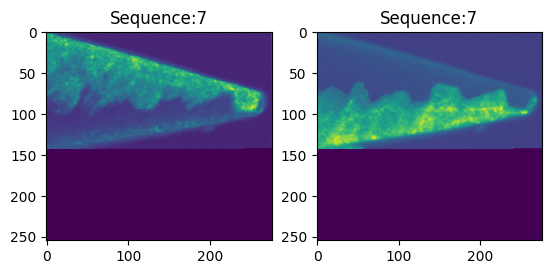

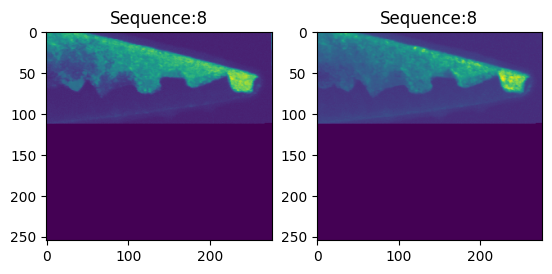

In [109]:
# Comparing two .mrc files with same shape
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

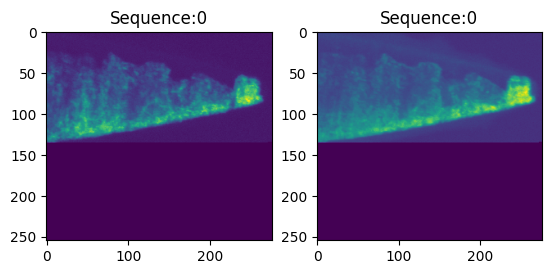

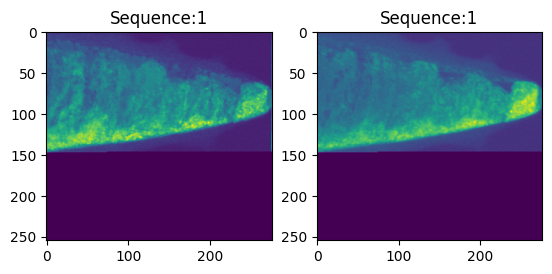

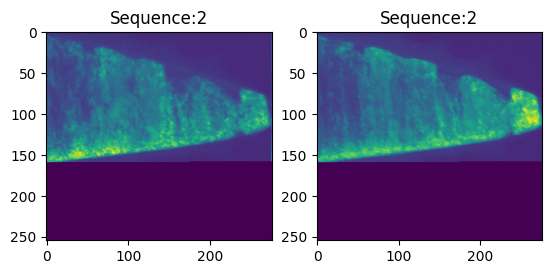

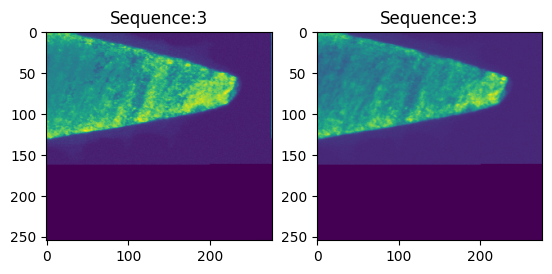

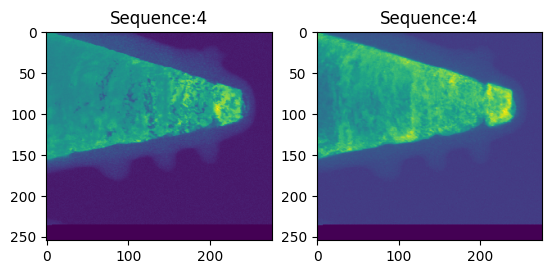

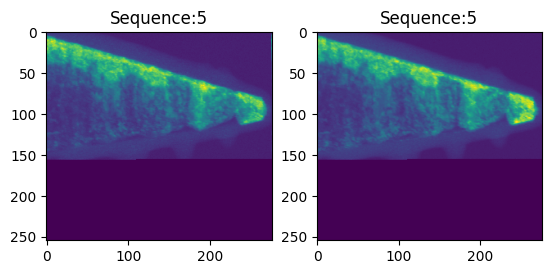

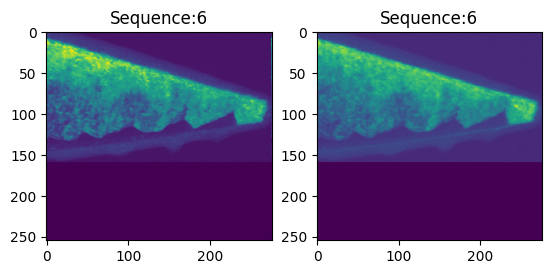

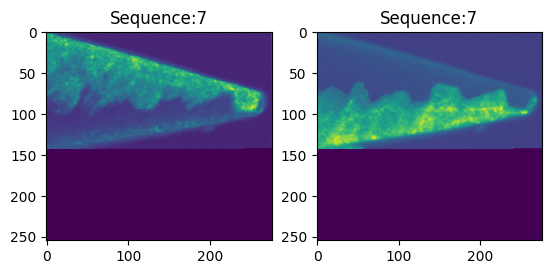

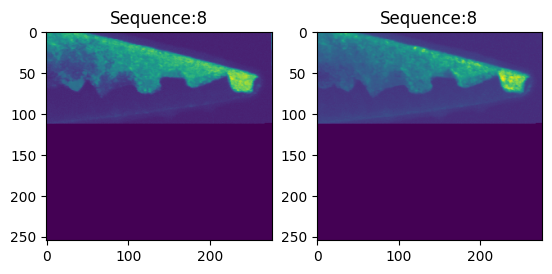

In [96]:
# Erase parts of image by 0
mrc1['data'][6, 160:256, :]=0  #trim_y_mrc i is sequence
mrc2['data'][6, 160:256, :]=0  #trim_y_mrc
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


In [97]:
# Find head points
i=0
for matrix in mrc1['data']:
    i=i+1
    # Use the np.argwhere() function to find indices of non-zero values
    head_indices = np.argwhere(matrix > 6e-5)
    if len(head_indices) > 0:
        rightmost_head_point = head_indices[np.argmax(head_indices[:, 1])]
        row, col = rightmost_head_point[0], rightmost_head_point[1]
        print("Coordinates of the rightmost head point (row, column):", (row, col))
    else:
        print("No head points in the image")


Coordinates of the rightmost head point (row, column): (81, 262)
Coordinates of the rightmost head point (row, column): (76, 268)
Coordinates of the rightmost head point (row, column): (138, 154)
Coordinates of the rightmost head point (row, column): (59, 228)
No head points in the image
Coordinates of the rightmost head point (row, column): (90, 265)
Coordinates of the rightmost head point (row, column): (93, 263)
Coordinates of the rightmost head point (row, column): (76, 260)
Coordinates of the rightmost head point (row, column): (55, 257)


In [276]:
# head point
headpoint = []
headpoint.append([81, 262])
headpoint.append([76, 268])
headpoint.append([50, 270])
headpoint.append([59, 256])
headpoint.append([90, 240])
headpoint.append([90, 265])
headpoint.append([93, 263])
headpoint.append([76, 267])
headpoint.append([55, 257])

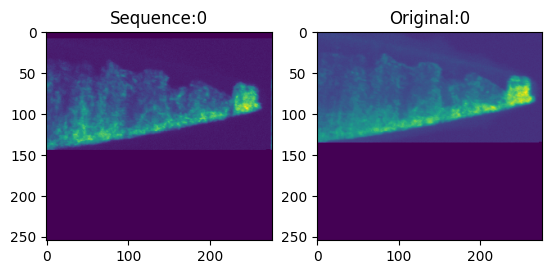

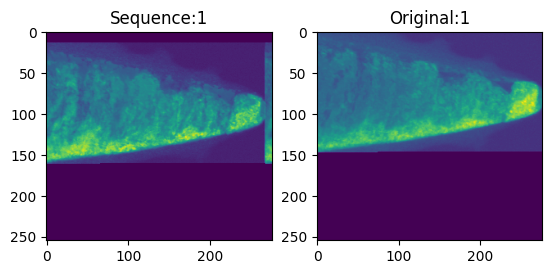

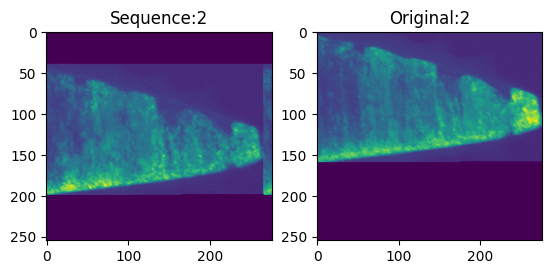

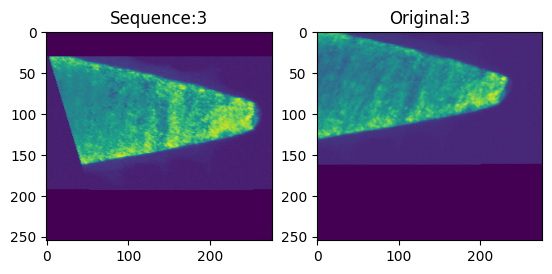

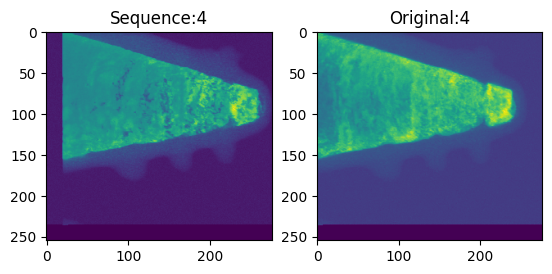

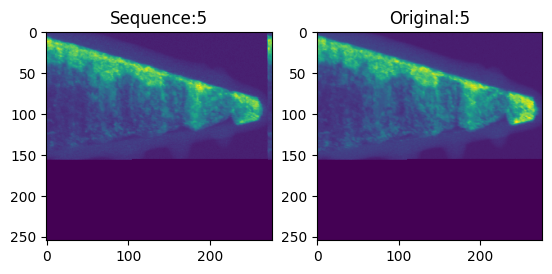

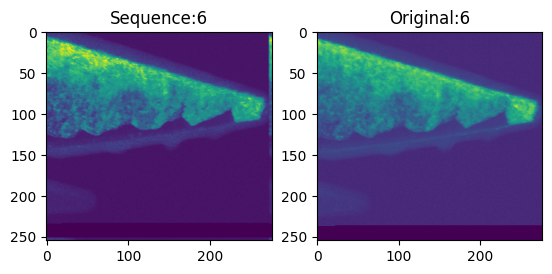

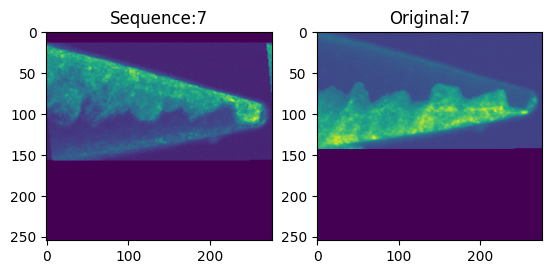

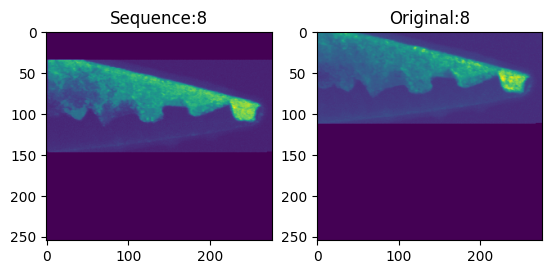

In [277]:
# Coarse align the heads of image to alignpoint
alignpoint=[90,260]
mrc1_temp=mrc1['data']

i=0
for matrix in mrc1['data']:
    shift_x=headpoint[i][1]-alignpoint[1]
    shift_y=headpoint[i][0]-alignpoint[0]
    mrc1_temp[i,:,:]=np.roll(mrc1['data'][i,:,:], (-shift_y, -shift_x), axis=(0, 1))
    i=i+1
    

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'][i, :, :])
    plt.title("Original:"+ str(i))
    i=i+1

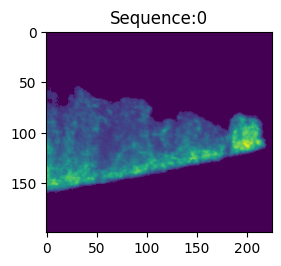

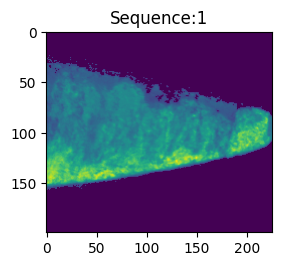

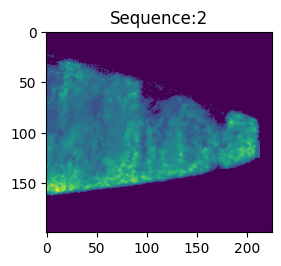

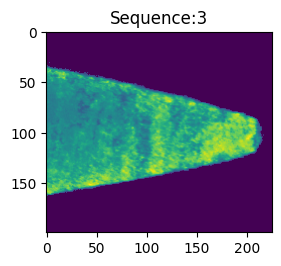

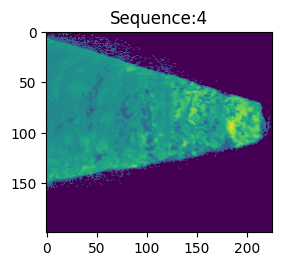

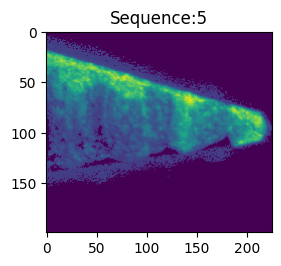

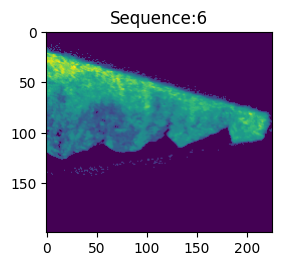

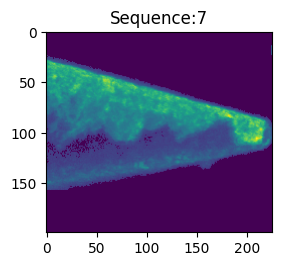

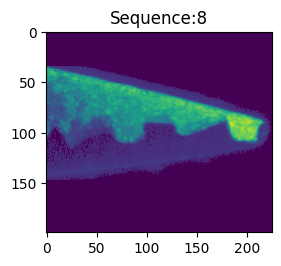

In [315]:
mrc1['data'][mrc1['data'] < 1.5e-5] = 0
mrc1['data'][2,:,:]=np.roll(mrc1['data'][2,:,:], (0, -5), axis=(0, 1))#shift down

#Trim mrc
matrix_trim = np.zeros((mrc1['data'].shape[0],200, 225))

i=0
for matrix in mrc1['data']:
    matrix_trim[i] = mrc1['data'][i,:,:][0:200,45:270]
    i=i+1
    
i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


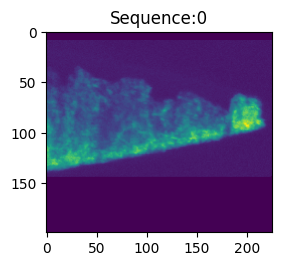

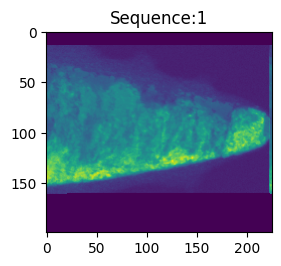

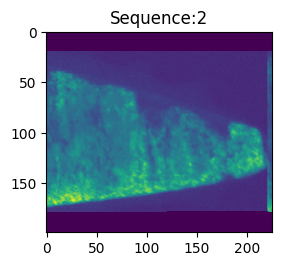

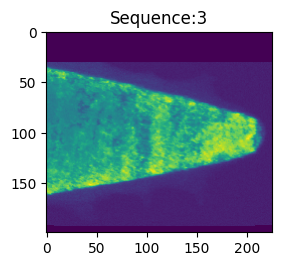

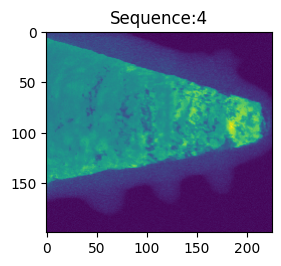

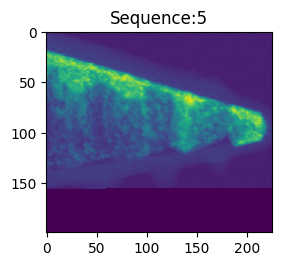

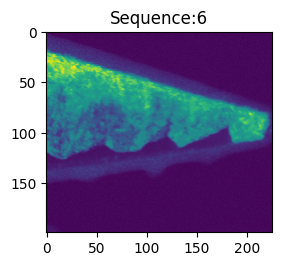

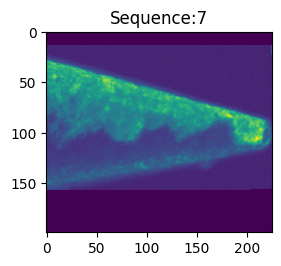

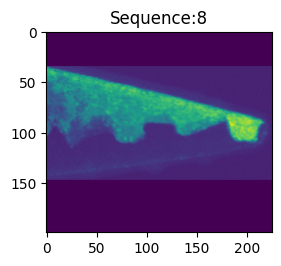

In [282]:
# Final adjustment

matrix_trim[2,:,:]=np.roll(matrix_trim[2,:,:], (-20, 0), axis=(0, 1))#shift down

i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


In [316]:
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

New MRC file saved: C:/4DSTEM data analysis/2023-08-16_FeB_PV/Analysis/MRC/Components 80_new_trim.mrc.


In [3]:
#remove some slices from MRC

# import PySide2
from PySide2.QtCore import QCoreApplication, QFile, QPointF, Qt
from PySide2.QtGui import QIcon
from PySide2.QtUiTools import QUiLoader
from PySide2.QtWidgets import (
    QApplication,
    QFileDialog,
    QMainWindow,
    QMessageBox,
    QTableWidgetItem,
)
import math
import tkinter as tk
from tkinter import ttk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from ncempy.io import mrc
from ncempy.io.mrc import mrcReader
import matplotlib.pyplot as plt 
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np

#remove some slices form MRC
fname = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(fname) 
remove_seq=[0,5,7,8] # specifiy which slices to be removed

#skip and 
matrix_trim = np.zeros((len(remove_seq),mrc1['data'].shape[1], mrc1['data'].shape[2]))

i=0
for item in remove_seq:
    matrix_trim[i] = mrc1['data'][remove_seq[i],:,:]
    i=i+1
    
i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

I/O error(13): Permission denied


AttributeError: 'fileMRC' object has no attribute 'fid'

In [25]:
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

New MRC file saved: C:/4DSTEM data analysis/2023-08-16_FeB_PV/Analysis/MRC/Components80_new_trim_cut.mrc.


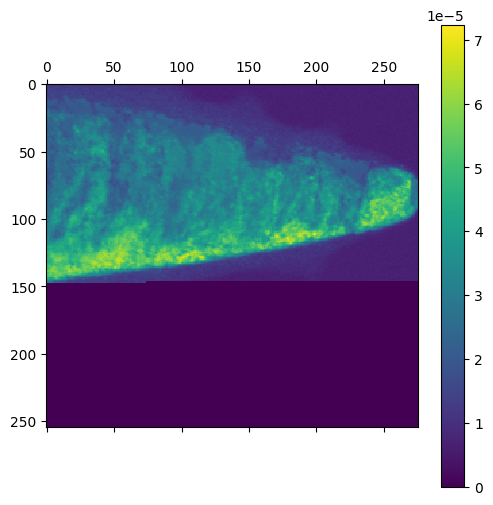

In [11]:
import tkinter as tk
from tkinter import ttk
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg

# Create a Tkinter window
root = tk.Tk()

# Define a sample matrix image (you can replace this with your own data)
matrix_image = mrc1['data'] [1, :, :]

# Create a function to plot the matrix image
# Create a new Tkinter window

# Create a Matplotlib figure
fig, ax = plt.subplots(figsize=(6, 6))

# Plot the matrix image as a heatmap
cax = ax.matshow(matrix_image, cmap="viridis")  # You can choose a different colormap

# Add a colorbar for reference
fig.colorbar(cax)

# Embed the Matplotlib figure into the Tkinter window
canvas = FigureCanvasTkAgg(fig, master=root)
canvas.get_tk_widget().pack()
canvas.draw()


# Start the Tkinter main loop
root.mainloop()


AttributeError: 'FigureCanvasTkAgg' object has no attribute 'bind'

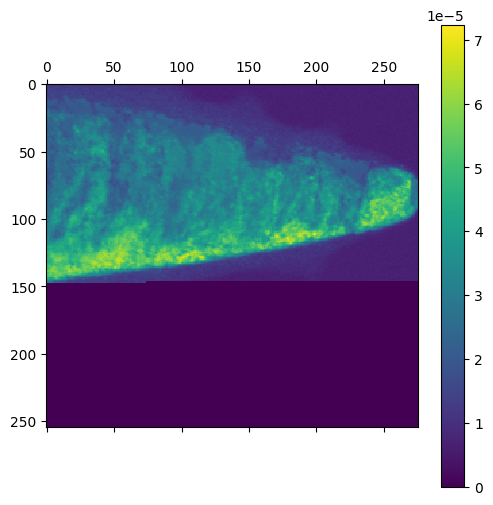

In [18]:
import tkinter as tk
from PIL import Image, ImageTk
import numpy as np

# Create the main window
root = tk.Tk()
root.title("Matrix Editor")

# Create an example matrix
matrix = np.zeros((400, 400, 3), dtype=np.uint8)  # Create a 400x400 blank matrix

# Create a Canvas for displaying the matrix
canvas = tk.Canvas(root, width=400, height=400)
canvas.pack()

# Initialize mouse position
last_x, last_y = None, None

# Callback function: When the left mouse button is pressed
def on_mouse_down(event):
    global last_x, last_y
    last_x, last_y = event.x, event.y

# Callback function: When the mouse is dragged
def on_mouse_drag(event):
    global last_x, last_y, matrix
    x, y = event.x, event.y
    radius = 1  # Define the radius for erasing pixels

    # Set pixels to white (erase) within the radius along the mouse path
    for i in range(min(last_x, x) - radius, max(last_x, x) + radius):
        for j in range(min(last_y, y) - radius, max(last_y, y) + radius):
            if 0 <= i < matrix.shape[1] and 0 <= j < matrix.shape[0]:
                matrix[j, i] = [255, 255, 255]  # Set to white

    # Update the image on the Canvas
    updated_image = Image.fromarray(matrix)
    updated_tk_image = ImageTk.PhotoImage(image=updated_image)
    canvas.create_image(0, 0, anchor=tk.NW, image=updated_tk_image)
    canvas.image = updated_tk_image

    last_x, last_y = x, y

# Create the initial image on the Canvas
initial_image = Image.fromarray(matrix)
initial_tk_image = ImageTk.PhotoImage(image=initial_image)
canvas.create_image(0, 0, anchor=tk.NW, image=initial_tk_image)
canvas.image = initial_tk_image

# Bind mouse button press and drag events
canvas.bind("<Button-1>", on_mouse_down)
canvas.bind("<B1-Motion>", on_mouse_drag)

# Run the main loop
root.mainloop()

In [ ]:
# mrc file coarse alignment written by Xinren Chen
# Version 01.10.2023

import math
import tkinter as tk
from tkinter import ttk
from skimage import filters
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from ncempy.io import mrc
from ncempy.io.mrc import mrcReader
import matplotlib.pyplot as plt 
from tkinter import filedialog
from PIL import Image, ImageTk
from tkinter import filedialog,IntVar
from tkinter import StringVar
from tkinter import DoubleVar
from tkinter import messagebox
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
import numpy as np
from collections import deque
import os

fname = '' #Predefine mrc file path, which is empty
Align_para=''
deformX=1
deformY=1
shiftX=0
shiftY=0
driftX=0
selected_index=0

# Function to display the current matrix in a given window
def display_current_matrix(window):
    global sequences_overlaying
    fig = Figure(figsize=(5, 5))
    canvas = FigureCanvasTkAgg(fig, master=window)
    canvas_widget = canvas.get_tk_widget()
    canvas_widget.pack()
    ax = fig.add_subplot(111)
    
    # Overlaying all slices
    i=0
    sequences_overlaying=np.zeros((sequences.shape[1],sequences.shape[2]))
    for matrix in sequences:
        sequences_overlaying =sequences_overlaying + sequences[i,:,:]
        i=i+1
        
    # Show sequences_overlaying
    ax.imshow(sequences_overlaying, cmap='viridis', interpolation='none')
    canvas.draw()
    
    # Function to update the matrix display
    def update_matrix(new_matrix):
        ax.clear()  # Clear the previous image
        im = ax.imshow(new_matrix, cmap='viridis', interpolation='none')
        text_widget.delete(1.0, tk.END)  
        text_widget.insert(1.0, 'Selected_index:'+str(selected_index)+'\nDeform:['+ str(deformX)+','+ str(deformY)+']'+'\nShift:['+ str(shiftX)+','+ str(shiftY)+']'+'\nDrift:['+ str(driftX)+']') 
        canvas.draw()
        
    # Function to update the selected region based on the drag rectangle
    def update_selection():
        global selected_sequence
        ax.clear()
        im = ax.imshow(sequences_overlaying, cmap='viridis', interpolation='none')
        # Highlight the selected region with a rectangle
        rect_x = [min(start_x, end_x), max(start_x, end_x)]
        rect_y = [min(start_y, end_y), max(start_y, end_y)]
        rect = plt.Rectangle((rect_x[0], rect_y[0]), rect_x[1] - rect_x[0], rect_y[1] - rect_y[0], fill=False, edgecolor='red', linewidth=2)
        ax.add_patch(rect)
        canvas.draw()

    # Function to handle mouse events for selecting a region in the new window
    def on_mouse(event):
        global start_x_trim, start_y_trim, end_x_trim, end_y_trim #for calling
        nonlocal start_x, start_y, end_x, end_y
        nonlocal dragging
        if event.xdata is not None and event.ydata is not None:
            if event.name == 'button_press_event':
                # Starting a new selection
                start_x = event.xdata
                start_y = event.ydata
                end_x = start_x
                end_y = start_y
                start_x_trim = start_x
                start_y_trim = start_y
                dragging = True
            elif event.name == 'motion_notify_event' and dragging:
                # Updating the selection while dragging
                end_x = event.xdata
                end_y = event.ydata
                end_x_trim = end_x 
                end_y_trim = end_y
            elif event.name == 'button_release_event':
                # Finalize the selection
                dragging = False
                update_selection()
    
    # Variables for tracking the selection rectangle in the new window
    start_x, start_y, end_x, end_y = 0, 0, 0, 0
    dragging = False

    # Connect mouse events for selecting a region in the new window
    canvas.mpl_connect('button_press_event', on_mouse)
    canvas.mpl_connect('motion_notify_event', on_mouse)
    canvas.mpl_connect('button_release_event', on_mouse)


def create_main_window():
    # Create the main window
    root = tk.Tk()
    #root.withdraw()# Hide root window
    root.title("MRC Alignment")
    
    # Create a Text widget and insert text into it
    text_widget = tk.Text(root, state=tk.NORMAL, width=20, height=30)
    text_widget.pack(side=tk.LEFT)  # Place the Text widget on the left side
    
    # Create a vertical scrollbar and associate it with the Text widget
    scrollbar = tk.Scrollbar(root, command=text_widget.yview)
    scrollbar.pack(side=tk.LEFT, fill=tk.Y)
    text_widget.config(yscrollcommand=scrollbar.set)
    def scroll_text():
        text_widget.yview_scroll(1, "units")  # Scroll down by 1 unit

    # Create a Matplotlib figure and embed it in the Tkinter window
    figure = Figure(figsize=(7, 5), dpi=100)
    canvas = FigureCanvasTkAgg(figure, master=root)
    canvas.get_tk_widget().pack(side=tk.TOP)  # Place the Matplotlib canvas on the left side
    
    # Create a frame for the controls (dropdown menu, slider, and buttons)
    control_frame = tk.Frame(root)
    control_frame.pack(side=tk.TOP, fill=tk.X)

    # Create a dropdown menu for selecting sequences by their index
    array_label = tk.Label(control_frame, text="Select Sequence:")
    array_label.pack(side=tk.LEFT)

    array_var = tk.StringVar()
    array_dropdown = ttk.Combobox(control_frame, textvariable=array_var)
    array_dropdown.pack(side=tk.LEFT)

    # Create an initial axis and image
    ax = figure.add_subplot(111)
     
    # Function to update the matrix display
    def update_matrix(new_matrix):
        ax.clear()  # Clear the previous image
        im = ax.imshow(new_matrix, cmap='viridis', interpolation='none')
        text_widget.delete(1.0, tk.END)  
        text_widget.insert(1.0, Align_para+'\nSelected_index:'+str(selected_index)+'\nDeform:['+ str(deformX)+','+ str(deformY)+']'+'\nShift:['+ str(shiftX)+','+ str(shiftY)+']'+'\nDrift:['+ str(driftX)+']') 
        text_widget.see(tk.END)  # Automatically scroll to the end
        canvas.draw()

    # Function to open a file dialog and set the selected file as the sequence
    def open_file_dialog():
        fname = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
        if fname:
            global mrcdata
            mrcdata = mrc.mrcReader(fname) 
        # Sample sequences (you can replace these with your own arrays)
        global sequences
        global selected_sequence
        sequences = mrcdata['data']
        selected_sequence = sequences[0]  # Default to the first sequence
        array_var.set(0)
        update_matrix(selected_sequence)
        if fname:
            file_name = fname.split("/")[-1]
            root.title("MRC Alignment ("+file_name+")")
            
    if not fname:
        open_file_dialog()

    # Function to save the current sequence to a .mrc file
    def save_to_mrc():
        #write MRC
        save_filepath = filedialog.asksaveasfilename(
        defaultextension=".mrc",  # Default file extension
        filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
        title="Save As"  # Dialog title
        )
        mrc2=mrc.mrcWriter(save_filepath, sequences.astype('float32'), mrcdata['pixelSize'])
        msg = f"New MRC file saved: {save_filepath}."
        messagebox.showinfo("Confirmation",msg)

    # Create a button to open a file dialog for selecting a sequence file
    open_button = tk.Button(control_frame, text="Select File", command=open_file_dialog)
    open_button.pack(side=tk.LEFT)

    # Create a slider to control the radius size
    radius_label = tk.Label(root, text="Eraser Size")
    radius_label.pack(side=tk.LEFT)

    radius_scale = tk.Scale(root, from_=1, to=20, orient="horizontal")
    radius_scale.pack(side=tk.LEFT)

    # Create a button to save the current sequence to a .mrc file
    save_button = tk.Button(root, text="Save new .mrc", command=save_to_mrc)
    save_button.pack(side=tk.RIGHT)

    # Function to handle sequence selection
    def select_sequence(event):
        global selected_index,Align_para,deformX,deformY,shiftX,shiftY,driftX
        selected_index = array_dropdown.current()
        Align_para=text_widget.get("1.0", "end-1c")
        deformX=1
        deformY=1
        shiftX=0
        shiftY=0
        driftX=0
        if selected_index is not None:
            global selected_sequence
            selected_sequence = sequences[selected_index]
            update_matrix(selected_sequence)

    array_dropdown['values'] = list(range(len(sequences)))
    array_dropdown.bind("<<ComboboxSelected>>", select_sequence)

    # Function to update the matrix based on mouse drag events
    def on_drag_erase(event):
        if event.xdata is not None and event.ydata is not None and event.button == 1:
            x = int(event.xdata + 0.5)
            y = int(event.ydata + 0.5)
            radius = radius_scale.get()  # Get the slider value as the radius
            save_state()  # Save the current state before making changes
            for i in range(y - radius, y + radius + 1):
                for j in range(x - radius, x + radius + 1):
                    if 0 <= i < selected_sequence.shape[0] and 0 <= j < selected_sequence.shape[1]:
                        selected_sequence[i, j] = 0  # Set the values within the radius range to 0
            update_matrix(selected_sequence)

    # Function to save the current state in the history
    def save_state():
        history.append(selected_sequence.copy())

    # Function to perform undo (Ctrl+Z)
    def undo(event):
        if len(history) > 1:
            history.pop()  # Remove the current state
            selected_sequence[:] = history[-1]  # Restore the previous state
            update_matrix(selected_sequence)

    # Function to load a sequence from a file
    def load_sequence(file_path):
        global last_opened_path
        last_opened_path = os.path.dirname(file_path)
        # Add your logic to load the sequence from the file
        # For example, you can use np.loadtxt or np.load to load data from a file
        # After loading the sequence, update the 'selected_sequence' variable and update the display
        # selected_sequence = np.loadtxt(file_path)  # Example: Load data from a text file
        # update_matrix(selected_sequence)

    # Function to shift the matrix up
    def shift_up():
        global selected_sequence
        global shiftY
        shiftY=shiftY+1
        selected_sequence = np.roll(selected_sequence, -1, axis=0)
        selected_add_index = multiply_matrix_dropdown.get()
        # if imported image, use image as background  
        if 'image' in globals():
            try:
                overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)
        #if no image and no overlay martrix  
        elif (selected_add_index == ''):
            update_matrix(selected_sequence)
        # if overlay another martrix has been selected
        else:
            try:
                overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
            except IndexError:
                messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)   

            
    # Function to shift the matrix down
    def shift_down():
        global selected_sequence
        global shiftY
        shiftY=shiftY-1
        selected_sequence = np.roll(selected_sequence, 1, axis=0)
        selected_add_index = multiply_matrix_dropdown.get()
        # if imported image, use image as background  
        if 'image' in globals():
            try:
                overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)
        #if no image and no overlay martrix  
        elif (selected_add_index == ''):
            update_matrix(selected_sequence)
        # if overlay another martrix has been selected
        else:
            try:
                overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
            except IndexError:
                messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)   

    # Function to shift the matrix left
    def shift_left():
        global selected_sequence
        global shiftX
        shiftX=shiftX-1
        selected_sequence = np.roll(selected_sequence, -1, axis=1)
        selected_add_index = multiply_matrix_dropdown.get()
        # if imported image, use image as background  
        if 'image' in globals():
            try:
                overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)
        #if no image and no overlay martrix  
        elif (selected_add_index == ''):
            update_matrix(selected_sequence)
        # if overlay another martrix has been selected
        else:
            try:
                overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
            except IndexError:
                messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)   

    # Function to shift the matrix right
    def shift_right():
        global selected_sequence
        global shiftX
        shiftX=shiftX+1
        selected_sequence = np.roll(selected_sequence, 1, axis=1)
        selected_add_index = multiply_matrix_dropdown.get()
        # if imported image, use image as background  
        if 'image' in globals():
            try:
                overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)
        #if no image and no overlay martrix  
        elif (selected_add_index == ''):
            update_matrix(selected_sequence)
        # if overlay another martrix has been selected
        else:
            try:
                overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
            except IndexError:
                messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)   

    def change_confirm():
        global selected_sequence
        global selected_index
        sequences[selected_index]=selected_sequence
        messagebox.showinfo("Confirmation","Confirmed")

    # Create buttons to shift the matrix in different directions

    # Create a "Confirm Changes" button
    confirm_button = tk.Button(control_frame, text="Confirm Changes", command=change_confirm)
    confirm_button.pack(side=tk.RIGHT)

    shift_right_button = tk.Button(control_frame, text="Shift Right", command=shift_right)
    shift_right_button.pack(side=tk.RIGHT)

    shift_left_button = tk.Button(control_frame, text="Shift Left", command=shift_left)
    shift_left_button.pack(side=tk.RIGHT)

    shift_down_button = tk.Button(control_frame, text="Shift Down", command=shift_down)
    shift_down_button.pack(side=tk.RIGHT)

    shift_up_button = tk.Button(control_frame, text="Shift Up", command=shift_up)
    shift_up_button.pack(side=tk.RIGHT)
    

    # Y Resize 
    def resize_matrix_y(original_matrix, scale_y):
        """
        Resize a 2D matrix in the y direction using linear interpolation.

        Parameters:
            original_matrix (np.array): The original 2D matrix.
            scale_y (float): The scaling factor in the y direction.
                            > 1.0 for stretch, 0.0 < scale_y < 1.0 for shrink.

        Returns:
            np.array: The resized matrix.
        """
        # Ensure the scale factor is valid
        if scale_y <= 0:
            raise ValueError("Scale factor must be greater than 0")

        # Get matrix size
        height, width = original_matrix.shape

        # Compute new height
        new_height = int(height * scale_y)

        # Compute the y coordinates for the original and resized matrices
        y_original = np.linspace(0, height-1, height)
        y_resized = np.linspace(0, height-1, new_height)

        # Initialize an empty matrix for the resized matrix
        resized_matrix = np.zeros((new_height, width))

        # Perform linear interpolation for each column
        for i in range(width):
            resized_matrix[:, i] = np.interp(y_resized, y_original, original_matrix[:, i])
        
        deformed_matrix=np.zeros((height, width))
        if (scale_y>1):
            deformed_matrix[:,:]= resized_matrix[0:height, 0:width] 
        else:
            deformed_matrix[0:new_height, 0:width]= resized_matrix[:, :]

        return deformed_matrix
    
    # X Resize 
    def resize_matrix_x(original_matrix, scale_x):
        """
        Resize a 2D matrix in the x direction using linear interpolation.

        Parameters:
            original_matrix (np.array): The original 2D matrix.
            scale_x (float): The scaling factor in the x direction.
                            > 1.0 for stretch, 0.0 < scale_x < 1.0 for shrink.

        Returns:
            np.array: The resized matrix.
        """
        # Ensure the scale factor is valid
        if scale_x <= 0:
            raise ValueError("Scale factor must be greater than 0")

        # Get matrix size
        height, width = original_matrix.shape

        # Compute new width
        new_width = int(width * scale_x)

        # Compute the x coordinates for the original and resized matrices
        x_original = np.linspace(0, width-1, width)
        x_resized = np.linspace(0, width-1, new_width)

        # Initialize an empty matrix for the resized matrix
        resized_matrix = np.zeros((height, new_width))

        # Perform linear interpolation for each row
        for i in range(height):
            resized_matrix[i, :] = np.interp(x_resized, x_original, original_matrix[i, :])
        deformed_matrix=np.zeros((height, width))
        if (scale_x>1):
            deformed_matrix[:,:]= resized_matrix[0:height, 0:width] 
        else:
            deformed_matrix[0:height, 0:new_width]= resized_matrix[:, :]
        return deformed_matrix

    # Function to handle "X Resize" button click
    def x_resize(parameter=None):
        global deformX #for output
        global selected_sequence 
        selected_add_index = multiply_matrix_dropdown.get()
        if parameter:
            resize_factor = parameter
        else:  
            resize_factor = float(resize_factor_entry.get())

        if not resize_factor:
            messagebox.showerror("Error", "Please enter a deforming factor.")
        else:
            deformX=deformX*resize_factor#for saving
            # Resize the matrix in the x direction by a factor 
            resize_selected_sequence = resize_matrix_x(selected_sequence, resize_factor)
            selected_sequence = resize_selected_sequence
            # if imported image, use image as background  
            if 'image' in globals():
                try:
                    overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
            #if no image and no overlay martrix  
            elif (selected_add_index == ''):
                update_matrix(selected_sequence)
            # if overlay another martrix has been selected
            else:
                try:
                    overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
                except IndexError:
                    messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                
                update_matrix(overlay_sequence)   

    # Function to handle "Y Resize" button click
    def y_resize(parameter=None):
        global deformY
        global selected_sequence 
        selected_add_index = multiply_matrix_dropdown.get()
        if parameter:
            resize_factor = parameter
        else:  
            resize_factor = float(resize_factor_entry.get())

        if not resize_factor:
            messagebox.showerror("Error", "Please enter a deforming factor.")
        else:
            deformY=deformY*resize_factor
            # Resize the matrix in the y direction by a factor
            resize_selected_sequence = resize_matrix_y(selected_sequence, resize_factor)
            selected_sequence = resize_selected_sequence
            # if imported image, use image as background  
            if 'image' in globals():
                try:
                    overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
            #if no image and no overlay martrix  
            elif (selected_add_index == ''):
                update_matrix(selected_sequence)
            # if overlay another martrix has been selected
            else:
                try:
                    overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
                except IndexError:
                    messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                
                update_matrix(overlay_sequence)   

    # Create an Entry widget for "Resize compensation factor"
    resize_factor_label = tk.Label(control_frame, text="Deforming Factor:")
    resize_factor_label.pack(side=tk.LEFT)
    resize_factor_entry = tk.Entry(control_frame)
    resize_factor_entry.pack(side=tk.LEFT)
    resize_factor_entry.insert(0, "0.8")  # set default "0.8"
    
    # Create an "X Resize" button
    x_resize_button = tk.Button(control_frame, text="X deform", command=x_resize)
    x_resize_button.pack(side=tk.LEFT)

    # Create a "Y Resize" button
    y_resize_button = tk.Button(control_frame, text="Y deform", command=y_resize)
    y_resize_button.pack(side=tk.LEFT)

        # Y flip 
    def flip_matrix_y(original_matrix, scale_y):
        """
        Resize a 2D matrix in the y direction using linear interpolation.

        Parameters:
            original_matrix (np.array): The original 2D matrix.
            scale_y (float): The scaling factor in the y direction.
                            > 1.0 for stretch, 0.0 < scale_y < 1.0 for shrink.

        Returns:
            np.array: The resized matrix.
        """
        # Ensure the scale factor is valid
        if scale_y <= 0:
            raise ValueError("Scale factor must be greater than 0")

        # Get matrix size
        height, width = original_matrix.shape

        # Compute new height
        new_height = int(height * scale_y)

        # Compute the y coordinates for the original and resized matrices
        y_original = np.linspace(0, height-1, height)
        y_resized = np.linspace(0, height-1, new_height)

        # Initialize an empty matrix for the resized matrix
        resized_matrix = np.zeros((new_height, width))

        # Perform linear interpolation for each column
        for i in range(width):
            resized_matrix[:, i] = np.interp(y_resized, y_original, original_matrix[:, i])
        
        deformed_matrix=np.zeros((height, width))
        if (scale_y>1):
            deformed_matrix[:,:]= resized_matrix[0:height, 0:width] 
        else:
            deformed_matrix[math.floor((height-new_height)/2):math.floor((height-new_height)/2)+new_height, 0:width]= resized_matrix[:, :]
        return deformed_matrix
    
    # Function to handle "Flip" button click
    def y_flip():
        global selected_sequence 
        selected_add_index = multiply_matrix_dropdown.get()
        resize_factor = math.cos(math.radians(float(flip_angle_entry.get())))
        if not resize_factor:
            messagebox.showerror("Error", "Please enter a flip angle.")
        else:
            # Resize the matrix in the y direction by a factor
            resize_selected_sequence = flip_matrix_y(selected_sequence, resize_factor)
            selected_sequence = resize_selected_sequence
            # if imported image, use image as background  
            if 'image' in globals():
                try:
                    overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
            #if no image and no overlay martrix  
            elif (selected_add_index == ''):
                update_matrix(selected_sequence)
            # if overlay another martrix has been selected
            else:
                try:
                    overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
                except IndexError:
                    messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
    def y_flip_merge():
        global selected_sequence 
        selected_add_index = multiply_matrix_dropdown.get()
        try:
            overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
            sequences[int(selected_add_index)] = overlay_sequence
            messagebox.showinfo("Flip Merge","Flip merged to overlay matrix")
        except IndexError:
            messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
        except Exception as e:
            messagebox.showinfo("Error",f"An error occurred: {str(e)}")
        update_matrix(overlay_sequence)
                
    # Create an Entry widget for "flip Angle"
    flip_angle_label = tk.Label(control_frame, text="flip Angle:")
    flip_angle_label.pack(side=tk.LEFT)
    flip_angle_entry = tk.Entry(control_frame)
    flip_angle_entry.pack(side=tk.LEFT)
    flip_angle_entry.insert(0, "10")  # set default "10"
    
    # Create an "flip" button
    flip_angle_button = tk.Button(control_frame, text="flip", command=y_flip)
    flip_angle_button.pack(side=tk.LEFT)
    
    # Create an "flip merge" button
    flip_angle_merge_button = tk.Button(control_frame, text="flip merge", command=y_flip_merge)
    flip_angle_merge_button.pack(side=tk.LEFT)
    
    # Create an Entry widget for "drift parameter"
    drift_parameter_label = tk.Label(control_frame, text="Drift Parameter:")
    drift_parameter_label.pack(side=tk.LEFT)
    drift_parameter_entry = tk.Entry(control_frame)
    drift_parameter_entry.pack(side=tk.LEFT)
    drift_parameter_entry.insert(0, "0.05")#set default 0.05
    # Function to handle "Left Drift" button click
    def left_drift(parameter=None):
        global selected_sequence
        global driftX
        selected_add_index = multiply_matrix_dropdown.get()
        if parameter:
            
            drift_value = parameter
            
        else:
            drift_value = drift_parameter_entry.get()
        # Process left drift using the drift_value
        # left Drift compensation
        row_index = 0  #  row_index is the start row number
        rowdrifty=1  #initial value
        if not drift_value:  # Check if drift_value is empty
            messagebox.showerror("Error", "Please enter a drift parameter.")
        else:
            # Process left drift using the drift_value
            drift_factor=float(drift_value); # left drift value of next row
            driftX=driftX-drift_factor
            for row in selected_sequence:
                shifted_row = np.append(selected_sequence[row_index][-math.floor(rowdrifty):selected_sequence.shape[1]],selected_sequence[row_index][:-math.floor(rowdrifty)]) # append with [0,...]
                selected_sequence[row_index] = shifted_row 
                row_index=row_index+1
                rowdrifty=rowdrifty+drift_factor
            # if imported image, use image as background  
            if 'image' in globals():
                try:
                    overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
            #if no image and no overlay martrix  
            elif (selected_add_index == ''):
                update_matrix(selected_sequence)
            # if overlay another martrix has been selected
            else:
                try:
                    overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
                except IndexError:
                    messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)   
            
    # Create a "Left Drift" button
    left_drift_button = tk.Button(control_frame, text="Left Drift", command=left_drift)
    left_drift_button.pack(side=tk.LEFT)

    # Function to handle "Right Drift" button click
    def right_drift(parameter=None):#also accept no parameter
        global selected_sequence 
        global image,new_matrix,driftX
        selected_add_index = multiply_matrix_dropdown.get()
        if parameter:
            drift_value = parameter       
        else:
            drift_value = drift_parameter_entry.get()
        # Process right drift using the drift_value
        row_index = 0  #  row_index is the start row number
        rowdrifty=0  #initial value
        if not drift_value:  # Check if drift_value is empty
            messagebox.showerror("Error", "Please enter a drift parameter.")
        else:
            # right Drift compensation
            drift_factor=float(drift_value); # left drift value of next row
            driftX=driftX+drift_factor
            for row in selected_sequence:
                shifted_row = np.append(selected_sequence[row_index][math.floor(rowdrifty):],[0] * math.floor(rowdrifty)) # append with [0,...]
                selected_sequence[row_index] = shifted_row 
                row_index=row_index+1
                rowdrifty=rowdrifty+drift_factor
            # if imported image, use image as background  
            if 'image' in globals():
                try:
                    overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)
            #if no image and no overlay martrix  
            elif (selected_add_index == ''):
                update_matrix(selected_sequence)
            # if overlay another martrix has been selected
            else:
                try:
                    overlay_sequence = selected_sequence + sequences[int(selected_add_index)]
                except IndexError:
                    messagebox.showinfo("Error","Invalid index: selected overlaying sequence index is invalid.")
                except Exception as e:
                    messagebox.showinfo("Error",f"An error occurred: {str(e)}")
                update_matrix(overlay_sequence)    
                
    # Create a "Right Drift" button
    right_drift_button = tk.Button(control_frame, text="Right Drift", command=right_drift)
    right_drift_button.pack(side=tk.LEFT)

    # Create a dropdown menu for selecting a matrix 
    multiply_matrix_label = tk.Label(root, text="Overlay Matrix:")
    multiply_matrix_label.pack(side=tk.LEFT)

    multiply_matrix_var = StringVar()
    multiply_matrix_dropdown = ttk.Combobox(root, textvariable=multiply_matrix_var)
    multiply_matrix_dropdown.pack(side=tk.LEFT)

    # Populate the dropdown menu with matrix options 
    multiply_matrix_dropdown['values'] = list(range(len(sequences)))

    # Function to handle matrix selection and multiplication
    def overlay_select_matrix():
        global selected_sequence
        global sequences
        selected_overlay_index = multiply_matrix_dropdown.get()
        try:
            overlay_sequence = selected_sequence + sequences[int(selected_overlay_index)]
        except IndexError:
            messagebox.showinfo("Error","Invalid index: selected_index is invalid.")
        except Exception as e:
            messagebox.showinfo("Error",f"An error occurred: {str(e)}")
        update_matrix(overlay_sequence)

    # Create a button to execute the overlaying of matrixs 
    select_multiply_button = tk.Button(root, text="Overlay selected sequence", command=overlay_select_matrix)
    select_multiply_button.pack(side=tk.LEFT)

    # Initialize history with the initial state
    history = deque([selected_sequence.copy()])

    # Initialize the last opened path to the current working directory
    last_opened_path = os.getcwd()

    # Bind the Ctrl+Z shortcut to the undo function
    root.bind("<Control-z>", undo)

    # Function normalize matrix
    def normalize_matrix(matrix, min_range=0, max_range=1):
        """
        Normalize a matrix to the specified range.
        
        Args:
        matrix (numpy.ndarray): The input matrix to be normalized.
        min_range (float): The minimum value of the normalized range (default is 0).
        max_range (float): The maximum value of the normalized range (default is 1).

        Returns:
        numpy.ndarray: The normalized matrix.
        """
        # Find the minimum and maximum values in the matrix using NumPy
        min_value = np.min(matrix)
        max_value = np.max(matrix)

        # Normalize the matrix to the specified range
        normalized_matrix = (matrix - min_value) * (max_range - min_range) / (max_value - min_value) + min_range
        return normalized_matrix

    # Function to handle "Import Image" button click
    def import_image():
        global image,new_matrix
        file_path = filedialog.askopenfilename(title="Select an Image File", filetypes=[("Image Files", "*.jpg *.png *.bmp *.jpeg *.gif *.tiff")])
        if file_path:
            try:
                # Open the image and convert it to grayscale
                image = Image.open(file_path).convert("L")
                # Get the shape of selected_sequence
                target_shape = selected_sequence.shape
                
                # Get the shape of the image
                image_shape = image.size[::-1]  # Swap width and height
                # Calculate the scaling factors for width and height
                width_scale = target_shape[1] / image_shape[1]
                height_scale = target_shape[0] / image_shape[0]
                # Determine the maximum scaling factor to fit on both dimensions
                max_scale = max(width_scale, height_scale)
                min_scale = min(width_scale, height_scale)
                # Create a new matrix with the same shape as selected_sequence
                new_matrix = np.zeros(target_shape, dtype=np.uint8)
                # Resize the image with the minimum scaling factor
                if bcimage_checkbox_var.get() == 1:
                    image = image.resize((int(image_shape[1] * max_scale), int(image_shape[0] * max_scale)), Image.LANCZOS)
                    # Paste the resized image into the new matrix
                    new_matrix[0:  target_shape[0], 0: target_shape[1]] = np.array(image)[0:  target_shape[0], 0: target_shape[1]]
                else:
                    image = image.resize((int(image_shape[1] * min_scale), int(image_shape[0] * min_scale)), Image.LANCZOS)
                    # Paste the resized image into the new matrix
                    new_matrix[0:  image.size[1], 0: image.size[0]] = np.array(image)
  
                # Display the new_matrix or perform any desired operations with it
                # For example, you can update selected_sequence with the new_matrix
                # selected_sequence = new_matrix
                
                # Get the file name from the file path
                image_name = os.path.basename(file_path)

                # Add the image name to the dropdown menu options
                #multiply_matrix_label["menu"].add_command(label=image_name, command=lambda name=image_name: selected_multiply_matrix.set(name))

            except Exception as e:
                messagebox.showerror("Error", f"An error occurred: {str(e)}")
            try:
                overlay_sequence = normalize_matrix(selected_sequence) + normalize_matrix(new_matrix)
            except Exception as e:
                messagebox.showinfo("Error",f"An error occurred: {str(e)}")
            update_matrix(overlay_sequence)
    def remove_image():
        global image
        if 'image' in globals():
            del image
            update_matrix(selected_sequence)
        
    # Create an "Import Image" button
    import_image_button = tk.Button(root, text="Import Background Image", command=import_image)
    import_image_button.pack(side=tk.LEFT)
    
    def bcimage_checkbox_changed():
        import_image()  
    # Create a checkbox for Full-Backgroundimage
    bcimage_checkbox_var = IntVar()
    bcimage_checkbox = tk.Checkbutton(root, text="Full-Backgroundimage", variable=bcimage_checkbox_var, command=bcimage_checkbox_changed)
    bcimage_checkbox.pack(side=tk.LEFT)
    
    # Create an "Remove Image" button
    import_image_button = tk.Button(root, text="Remove Background Image", command=remove_image)
    import_image_button.pack(side=tk.LEFT)

    # Function to rotate the displayed matrix clockwise by a specified angle
    def rotate_matrix(angle):
        global selected_sequence
        rotated_matrix = np.rot90(selected_sequence, k=int(angle / 90))
        update_matrix(rotated_matrix)  # Update the displayed matrix with the rotated version

    # Function to handle rotation based on the selected angle
    def rotate_selected():
        angle = angle_var.get()
        rotate_matrix(angle)

    # Create a label for the rotation angle
    angle_label = tk.Label(root, text="Rotation Angle:")
    angle_label.pack(side=tk.LEFT)

    # Create a Spinbox to select the rotation angle
    angle_var = DoubleVar()
    angle_spinbox = tk.Spinbox(root, from_=0, to=360, increment=1, textvariable=angle_var)
    angle_spinbox.pack(side=tk.LEFT)

    # Create a button to perform the rotation
    rotate_button = tk.Button(root, text="Rotate", command=rotate_selected)
    rotate_button.pack(side=tk.LEFT)

    # Connect mouse events for drawing
    canvas.mpl_connect('motion_notify_event', on_drag_erase)  

    # # Create a Tkinter variable to control whether dragging for movement is enabled
    # dragging_enabled_erase = tk.BooleanVar()
    # dragging_enabled_erase.set(False)    

    # # Function to toggle dragging for selection
    # def toggle_dragging_erase():
    #     dragging_enabled_erase.set(not dragging_enabled_erase.get())

    # # Create a button to toggle dragging for selection
    # toggle_dragging_erase_button = tk.Button(root, text="Erase", command=toggle_dragging_erase)
    # toggle_dragging_erase_button.pack()


    #Open a new window for showing picture for trimming
    def open_new_window():
        new_window = tk.Toplevel()  # Create a new Tkinter window
        new_window.title("Overlaying all slices for trimming")  # Set the title for the new window
        display_current_matrix(new_window)  # Display the current matrix in the new window
        
        def trim_confirm():
            global selected_sequence,sequences
            global start_x_trim, start_y_trim, end_x_trim, end_y_trim
            selected_sequence=selected_sequence[math.floor(min(start_y_trim, end_y_trim)):math.floor(max(start_y_trim, end_y_trim)),math.floor(min(start_x_trim, end_x_trim)):math.floor(max(start_x_trim, end_x_trim))]
            update_matrix(selected_sequence)
            # Apply to all slices
            i=0
            sequences_trim=np.zeros((sequences.shape[0],math.floor(max(start_y_trim, end_y_trim))-math.floor(min(start_y_trim, end_y_trim)),math.floor(max(start_x_trim, end_x_trim))-math.floor(min(start_x_trim, end_x_trim))))
            for matrix in sequences:
                sequences_trim[i] = sequences[i,:,:][math.floor(min(start_y_trim, end_y_trim)):math.floor(max(start_y_trim, end_y_trim)),math.floor(min(start_x_trim, end_x_trim)):math.floor(max(start_x_trim, end_x_trim))]
                i=i+1
            del sequences #due to mismatch of the shape after trimming, delete it first
            sequences=sequences_trim
            
        def trim_all_button_click():
            trim_confirm()
            messagebox.showinfo("Trimming confirm", "Applied trimming to all slices")
            new_window.withdraw()# Hide new_window 
        button_in_new_window = tk.Button(new_window, text="Trim all slices in the mrc stack", command=trim_all_button_click)
        button_in_new_window.pack()
    
    # Create a function to handle the creation of a new window and image display
    def show_thresholded_image():
        # Create a new Tkinter window
        new_window = tk.Toplevel()
        new_window.title("Thresholded Image")

        # Generate the thresholded image
        thresholded_image = filters.threshold_yen(sequences[8].T).astype(float)

        # Create a Figure object and add the thresholded image to it
        fig, ax = plt.subplots()
        ax.imshow(thresholded_image)
        ax.axis('off')  # Hide the axes

        # Create a Tkinter canvas for displaying the image in the new window
        canvas = FigureCanvasTkAgg(fig, master=new_window)
        canvas_widget = canvas.get_tk_widget()
        canvas_widget.pack()
        
    # Use try_all_threshold to generate an image and save it
    #fig, ax = filters.try_all_threshold(sequences[8].T, verbose=False)
    #plt.savefig("threshold_example.png")

    def display_image(image_path):
        # Initialize Tkinter window
        root = tk.Tk()
        root.title("Image Display")

        # Open image file and convert to Tkinter-compatible format
        img = Image.open(image_path)
        tk_img = ImageTk.PhotoImage(img)

        # Create a Canvas and display the image on it
        canvas = tk.Canvas(root, width=img.width, height=img.height)
        canvas.pack()
        canvas.create_image(0, 0, anchor=tk.NW, image=tk_img)

        # Run the Tkinter event loop
        root.mainloop()
        
    def save_alignment():
        # Get the content of the Text widget
        text_content = text_widget.get("1.0", tk.END)

        # Open a file dialog to select the save path
        save_path = filedialog.asksaveasfilename(defaultextension=".txt", filetypes=[("Text Files", "*.txt")])

        if save_path:
            # Save the content to the selected file
            with open(save_path, "w") as file:
                file.write(text_content)
                
    def load_alignment_file(file_path):
        try:
            with open(file_path, "r") as file:
                content = file.read()
            return content
        except FileNotFoundError:
            return None 
    
    def parse_text_content(text_content):

        lines = text_content.split("Selected_")
        print(lines)
        param_array = []


        for line in lines:
            line = line.strip()  
            print(line)
            if line:
                params = line.splitlines()
                print(params)
                param_dict = {}
                for param in params:
                    if ":" in param:
                        name, value = param.split(":", 1)
                        print(name, value)
                        param_dict[name.strip()] = value.strip()
                param_array.append(param_dict)

        return param_array
    # takes an input string and returns a list of extracted floating-point numbers.
    def extract_numbers(input_string):
        parts = input_string.strip('[]').split(',')
        float_numbers = [float(part) for part in parts]
        return float_numbers
    
    def load_and_assign_text():
        global params_array
        global sequences
        file_path = filedialog.askopenfilename(filetypes=[("Text Files", "*.txt")])

        if file_path:
            file_content = load_alignment_file(file_path)
            
            if file_content is not None:
                params_array = parse_text_content(file_content)

                print(file_content)
                for params in params_array:
                    selected_index = params.get("index", "N/A")
                    deform = params.get("Deform", "N/A")
                    shift = params.get("Shift", "N/A")
                    drift = params.get("Drift", "N/A")
                    print(f"Selected_index: {selected_index}")
                    print(f"Deform: {deform}")
                    print(f"Shift: {shift}")
                    print(f"Drift: {drift}")
                    print(int(''.join(map(str, {selected_index}))))
                    
                    pdeform = extract_numbers(''.join(map(str, {deform})))
                    
                    resize_selected_sequence = resize_matrix_x(sequences[int(''.join(map(str, {selected_index})))], pdeform[0])
                    resize_selected_sequence = resize_matrix_y(resize_selected_sequence, pdeform[1])
                    #resize_selected_sequence = left_drift(resize_selected_sequence, pdeform[1])
                    
                    sequences[int(''.join(map(str, {selected_index})))] = resize_selected_sequence
                    
                    
                    
                    selected_sequence = sequences[array_dropdown.current()]
                    update_matrix(selected_sequence)
                    text_widget.delete(1.0, tk.END)  
                    text_widget.insert(1.0, file_content) 
            else:
                messagebox.showinfo("Error",f"No file or uncorrect file.")
            
    # Create a button to trigger the creation and display of the new window
    #show_button = tk.Button(root, text="Show Thresholded Image", command=show_thresholded_image)
    #show_button.pack()
    #display_image("threshold_example.png")

    # Create a button to open a new window
    new_window_button = tk.Button(root, text="Trim mrc slices", command=open_new_window)
    new_window_button.pack(side=tk.LEFT)

    # Create a button to save the Text widget's content to a file
    save_button = tk.Button(root, text="Save Alignment", command=save_alignment)
    save_button.pack(side=tk.LEFT)
    
    # Create a button to load and assign text
    load_button = tk.Button(root, text="Load Alignment", command=load_and_assign_text)
    load_button.pack(side=tk.LEFT)
    root.mainloop()

create_main_window()

# Run the Tkinter main loop
root.mainloop()

    



['\n', 'index:0\nDeform:[0.5,1]\nShift:[0,0]\nDrift:[0]\n', 'index:1\nDeform:[0.5,1]\nShift:[0,0]\nDrift:[0]\n', 'index:2\nDeform:[1,1]\nShift:[0,0]\nDrift:[0]\n', 'index:3\nDeform:[1,1]\nShift:[0,0]\nDrift:[0]\n']

index:0
Deform:[0.5,1]
Shift:[0,0]
Drift:[0]
['index:0', 'Deform:[0.5,1]', 'Shift:[0,0]', 'Drift:[0]']
index 0
Deform [0.5,1]
Shift [0,0]
Drift [0]
index:1
Deform:[0.5,1]
Shift:[0,0]
Drift:[0]
['index:1', 'Deform:[0.5,1]', 'Shift:[0,0]', 'Drift:[0]']
index 1
Deform [0.5,1]
Shift [0,0]
Drift [0]
index:2
Deform:[1,1]
Shift:[0,0]
Drift:[0]
['index:2', 'Deform:[1,1]', 'Shift:[0,0]', 'Drift:[0]']
index 2
Deform [1,1]
Shift [0,0]
Drift [0]
index:3
Deform:[1,1]
Shift:[0,0]
Drift:[0]
['index:3', 'Deform:[1,1]', 'Shift:[0,0]', 'Drift:[0]']
index 3
Deform [1,1]
Shift [0,0]
Drift [0]

Selected_index:0
Deform:[0.5,1]
Shift:[0,0]
Drift:[0]
Selected_index:1
Deform:[0.5,1]
Shift:[0,0]
Drift:[0]
Selected_index:2
Deform:[1,1]
Shift:[0,0]
Drift:[0]
Selected_index:3
Deform:[1,1]
Shift:[0,0]
D

skimage.filters.thresholding.threshold_isodata
skimage.filters.thresholding.threshold_li
skimage.filters.thresholding.threshold_mean
skimage.filters.thresholding.threshold_minimum
skimage.filters.thresholding.threshold_otsu
skimage.filters.thresholding.threshold_triangle
skimage.filters.thresholding.threshold_yen


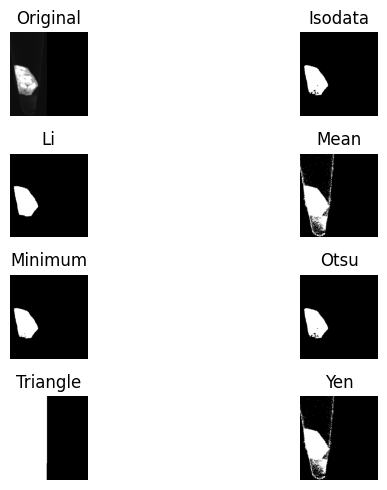

In [72]:
from skimage import filters
JIMge=filters.try_all_threshold(sequences[8].T);

In [8]:
ImageTk.PhotoImage(JIMge)

TypeError: unhashable type: 'numpy.ndarray'